In [2]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline


In [3]:
def f(x):
    return np.exp(-x**2)


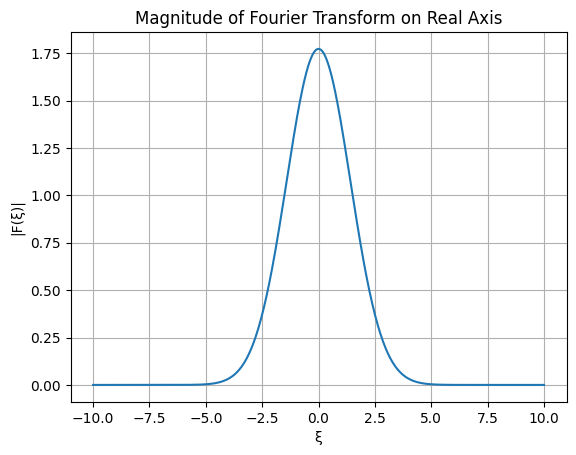

In [7]:
x = np.linspace(-20, 20, 5000)
xi = np.linspace(-10, 10, 500)

F_real = []

for k in xi:
    integrand = f(x) * np.exp(-1j * k * x)
    F_real.append(np.trapezoid(integrand, x))

F_real = np.array(F_real)

plt.figure()
plt.plot(xi, np.abs(F_real))
plt.title("Magnitude of Fourier Transform on Real Axis")
plt.xlabel("ξ")
plt.ylabel("|F(ξ)|")
plt.grid(True)
plt.show()


In [5]:
xi_vals  = np.linspace(-5, 5, 200)     # Real part
eta_vals = np.linspace(-3, 3, 200)     # Imaginary part

XI, ETA = np.meshgrid(xi_vals, eta_vals)
Z = XI + 1j * ETA


In [8]:
x = np.linspace(-20, 20, 6000)

FZ = np.zeros_like(Z, dtype=complex)

for i in range(Z.shape[0]):
    for j in range(Z.shape[1]):
        z = Z[i, j]
        integrand = f(x) * np.exp(-1j * z * x)
        FZ[i, j] = np.trapezoid(integrand, x)


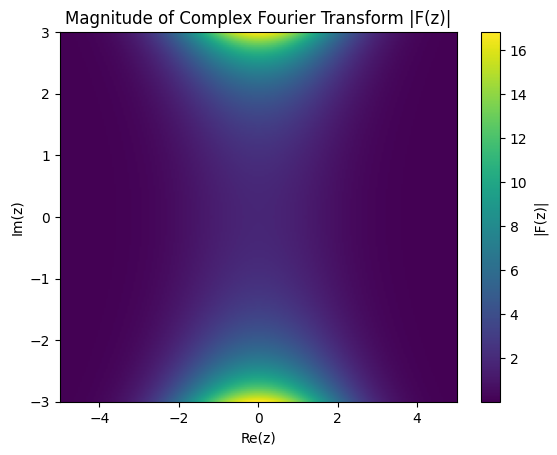

In [9]:
plt.figure()
plt.imshow(np.abs(FZ), extent=[-5,5,-3,3], origin='lower', aspect='auto')
plt.colorbar(label="|F(z)|")
plt.xlabel("Re(z)")
plt.ylabel("Im(z)")
plt.title("Magnitude of Complex Fourier Transform |F(z)|")
plt.show()


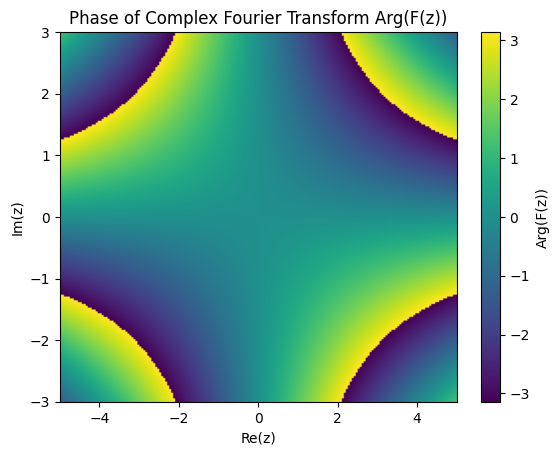

In [11]:
plt.figure()
plt.imshow(np.angle(FZ), extent=[-5,5,-3,3], origin='lower', aspect='auto')
plt.colorbar(label="Arg(F(z))")
plt.xlabel("Re(z)")
plt.ylabel("Im(z)")
plt.title("Phase of Complex Fourier Transform Arg(F(z))")
plt.show()


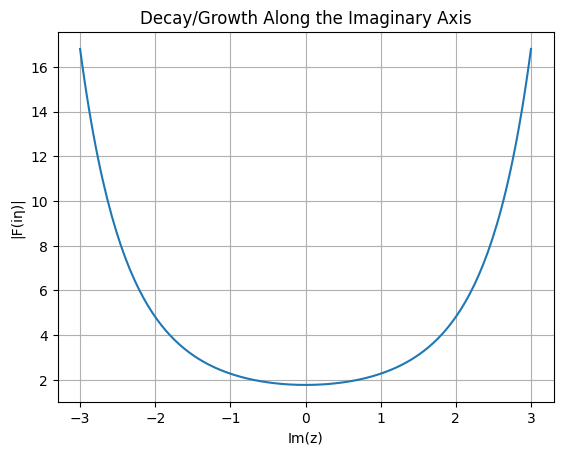

In [12]:
mid_index = len(xi_vals)//2

plt.figure()
plt.plot(eta_vals, np.abs(FZ[:, mid_index]))
plt.xlabel("Im(z)")
plt.ylabel("|F(iη)|")
plt.title("Decay/Growth Along the Imaginary Axis")
plt.grid(True)
plt.show()


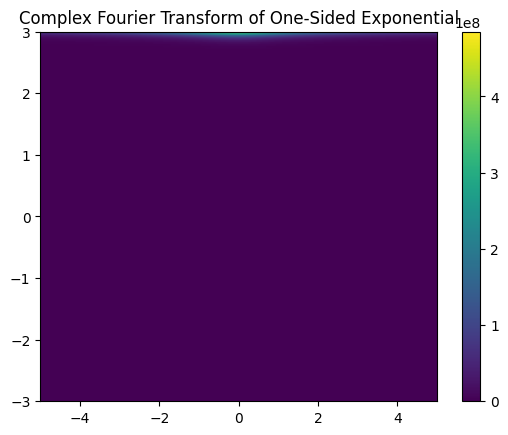

In [14]:
def f2(x):
    return np.exp(-2*x) * (x > 0)

FZ2 = np.zeros_like(Z, dtype=complex)

for i in range(Z.shape[0]):
    for j in range(Z.shape[1]):
        z = Z[i, j]
        integrand = f2(x) * np.exp(-1j * z * x)
        FZ2[i, j] = np.trapezoid(integrand, x)

plt.figure()
plt.imshow(np.abs(FZ2), extent=[-5,5,-3,3], origin='lower', aspect='auto')
plt.colorbar()
plt.title("Complex Fourier Transform of One-Sided Exponential")
plt.show()


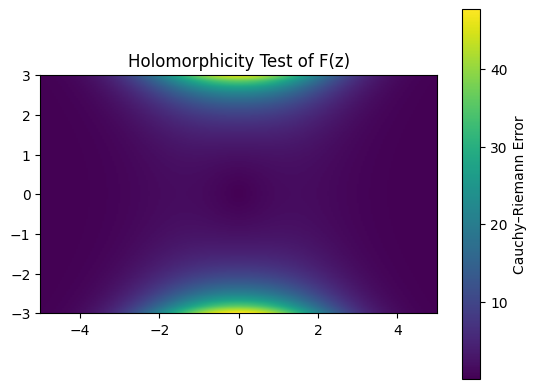

In [15]:
dx = xi_vals[1] - xi_vals[0]
dy = eta_vals[1] - eta_vals[0]

Fx = (FZ[:,2:] - FZ[:,:-2]) / (2*dx)
Fy = (FZ[2:,:] - FZ[:-2,:]) / (2*dy)

CR_error = np.abs(Fx[1:-1,:] - 1j*Fy[:,1:-1])

plt.figure()
plt.imshow(CR_error, extent=[-5,5,-3,3], origin='lower')
plt.colorbar(label="Cauchy–Riemann Error")
plt.title("Holomorphicity Test of F(z)")
plt.show()


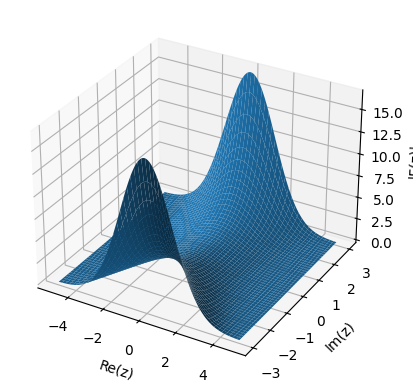

In [16]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(XI, ETA, np.abs(FZ))
ax.set_xlabel("Re(z)")
ax.set_ylabel("Im(z)")
ax.set_zlabel("|F(z)|")
plt.show()


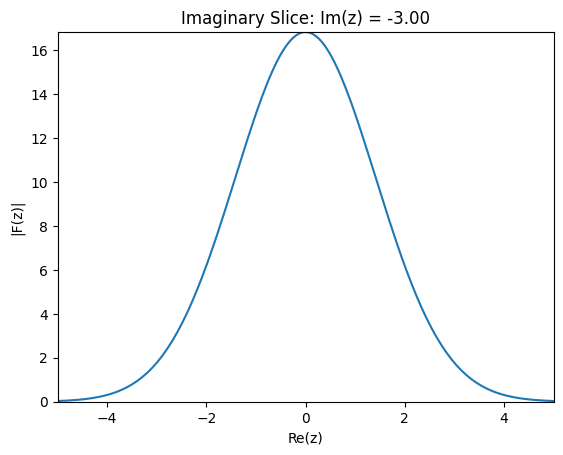

In [17]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
line, = ax.plot(xi_vals, np.abs(FZ[0, :]))

ax.set_xlim(xi_vals[0], xi_vals[-1])
ax.set_ylim(0, np.max(np.abs(FZ)))
ax.set_xlabel("Re(z)")
ax.set_ylabel("|F(z)|")
title = ax.set_title("")

def update(frame):
    line.set_ydata(np.abs(FZ[frame, :]))
    title.set_text(f"Imaginary Slice: Im(z) = {eta_vals[frame]:.2f}")
    return line, title

ani = FuncAnimation(
    fig, update,
    frames=len(eta_vals),
    interval=50
)

HTML(ani.to_jshtml())


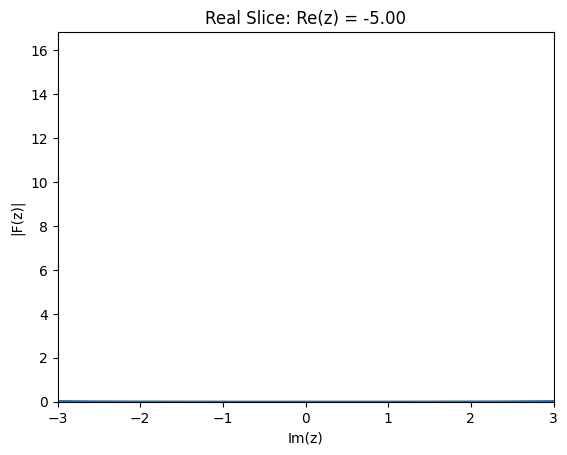

In [18]:
fig, ax = plt.subplots()
line, = ax.plot(eta_vals, np.abs(FZ[:, 0]))

ax.set_xlim(eta_vals[0], eta_vals[-1])
ax.set_ylim(0, np.max(np.abs(FZ)))
ax.set_xlabel("Im(z)")
ax.set_ylabel("|F(z)|")
title = ax.set_title("")

def update(frame):
    line.set_ydata(np.abs(FZ[:, frame]))
    title.set_text(f"Real Slice: Re(z) = {xi_vals[frame]:.2f}")
    return line, title

ani2 = FuncAnimation(
    fig, update,
    frames=len(xi_vals),
    interval=50
)

HTML(ani2.to_jshtml())


In [19]:
ani.save("imaginary_sweep.mp4", writer="ffmpeg", fps=30)
ani2.save("real_sweep.mp4", writer="ffmpeg", fps=30)
